In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels
from scipy.stats import chi2_contingency
import plotly.graph_objects as go

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.mixture import GaussianMixture

# Assignment 1
## K-NN and Decision Trees for Dry beans classification

## 1. Download the dataset

In [2]:
df = pd.read_excel('DryBeanDataSet.xlsx')

## 1.5 Playing around with the data

In [3]:
df.shape

(13611, 22)

In [4]:
df.head()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,Constantness,EquivDiameter,Colour,...,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,ShapeFactor5,ShapeFactor6,Class,Sort order
0,84648,1132.054,439.915710,248.961941,1.767000,0.824453,86779,1,328.294351,brown,...,0.830027,0.746266,0.005197,0.000994,0.556914,3.487008,0.984066,50.809833,CALI,0.134791
1,39704,736.873,271.659919,186.481404,1.456767,0.727175,40106,1,224.839282,black,...,0.918880,0.82765,0.006842,0.001980,0.685004,1.242335,0.997891,148.508874,DERMASON,0.898848
2,35835,687.914,237.704180,192.176759,1.236904,0.588537,36190,1,213.603696,green,...,0.951588,0.898611,0.006633,0.002668,0.807503,2.813489,0.998803,82.107117,SEKER,0.539684
3,223035,1817.278,680.812555,419.994347,1.621004,0.787040,225889,1,532.894907,brown,...,0.848673,0.782734,0.003052,0.000707,0.612672,3.074472,0.993144,147.347735,BOMBAY,0.149130
4,41957,767.143,287.962974,186.166695,1.546802,0.762918,42310,1,231.130508,brown,...,0.895904,0.80264,0.006863,0.001757,0.644230,2.213954,0.996497,22.893826,SIRA,0.447635


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13611 entries, 0 to 13610
Data columns (total 22 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             13611 non-null  int64  
 1   Perimeter        13611 non-null  float64
 2   MajorAxisLength  13611 non-null  float64
 3   MinorAxisLength  13611 non-null  float64
 4   AspectRation     13611 non-null  float64
 5   Eccentricity     13611 non-null  float64
 6   ConvexArea       13611 non-null  int64  
 7   Constantness     13611 non-null  int64  
 8   EquivDiameter    13611 non-null  float64
 9   Colour           13611 non-null  object 
 10  Extent           13611 non-null  object 
 11  Solidity         13611 non-null  float64
 12  roundness        13611 non-null  float64
 13  Compactness      13611 non-null  object 
 14  ShapeFactor1     13611 non-null  float64
 15  ShapeFactor2     13611 non-null  float64
 16  ShapeFactor3     13611 non-null  float64
 17  ShapeFactor4

In [6]:
df.Class.value_counts()

Class
DERMASON    3542
SIRA        2634
SEKER       2025
HOROZ       1927
CALI        1628
BARBUNYA    1317
BOMBAY       521
?             17
Name: count, dtype: int64

In [7]:
(df=='?').sum()

Area                0
Perimeter           0
MajorAxisLength     0
MinorAxisLength     0
AspectRation        0
Eccentricity        0
ConvexArea          0
Constantness        0
EquivDiameter       0
Colour              6
Extent              6
Solidity            0
roundness           0
Compactness        18
ShapeFactor1        0
ShapeFactor2        0
ShapeFactor3        0
ShapeFactor4        0
ShapeFactor5        0
ShapeFactor6        5
Class              17
Sort order          0
dtype: int64

In [8]:
df[df == '?'] = np.nan

In [9]:
df.isna().sum()

Area                0
Perimeter           0
MajorAxisLength     0
MinorAxisLength     0
AspectRation        0
Eccentricity        0
ConvexArea          0
Constantness        0
EquivDiameter       0
Colour              6
Extent              6
Solidity            0
roundness           0
Compactness        18
ShapeFactor1        0
ShapeFactor2        0
ShapeFactor3        0
ShapeFactor4        0
ShapeFactor5        0
ShapeFactor6        5
Class              17
Sort order          0
dtype: int64

In [10]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Area,13611.0,53048.284549,29324.095717,20420.000000,36328.000000,44652.000000,61332.000000,2.546160e+05
Perimeter,13611.0,855.283459,214.289696,524.736000,703.523500,794.941000,977.213000,1.985370e+03
MajorAxisLength,13611.0,320.141867,85.694186,183.601165,253.303633,296.883367,376.495012,7.388602e+02
MinorAxisLength,13611.0,202.270714,44.970091,122.512653,175.848170,192.431733,217.031741,4.601985e+02
AspectRation,13611.0,1.583242,0.246678,1.024868,1.432307,1.551124,1.707109,2.430306e+00
Eccentricity,13611.0,0.750895,0.092002,0.218951,0.715928,0.764441,0.810466,9.114230e-01
ConvexArea,13611.0,53765.692602,29778.009358,-30.000000,36714.500000,45178.000000,62294.000000,2.632610e+05
Constantness,13611.0,0.902873,0.296142,0.000000,1.000000,1.000000,1.000000,1.000000e+00
EquivDiameter,13611.0,476.254106,25836.865632,0.161417,215.068003,238.438026,279.452162,3.014441e+06
Solidity,13611.0,0.987143,0.004660,0.919246,0.985670,0.988283,0.990013,9.946775e-01


In [11]:
df.infer_objects()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,Constantness,EquivDiameter,Colour,...,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,ShapeFactor5,ShapeFactor6,Class,Sort order
0,84648,1132.054,439.915710,248.961941,1.767000,0.824453,86779,1,328.294351,brown,...,0.830027,0.746266,0.005197,0.000994,0.556914,3.487008,0.984066,50.809833,CALI,0.134791
1,39704,736.873,271.659919,186.481404,1.456767,0.727175,40106,1,224.839282,black,...,0.918880,0.827650,0.006842,0.001980,0.685004,1.242335,0.997891,148.508874,DERMASON,0.898848
2,35835,687.914,237.704180,192.176759,1.236904,0.588537,36190,1,213.603696,green,...,0.951588,0.898611,0.006633,0.002668,0.807503,2.813489,0.998803,82.107117,SEKER,0.539684
3,223035,1817.278,680.812555,419.994347,1.621004,0.787040,225889,1,532.894907,brown,...,0.848673,0.782734,0.003052,0.000707,0.612672,3.074472,0.993144,147.347735,BOMBAY,0.149130
4,41957,767.143,287.962974,186.166695,1.546802,0.762918,42310,1,231.130508,brown,...,0.895904,0.802640,0.006863,0.001757,0.644230,2.213954,0.996497,22.893826,SIRA,0.447635
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13606,23018,578.382,203.761000,144.297607,1.412089,0.706041,23465,1,171.194123,black,...,0.864665,0.840171,0.008852,0.002721,0.705888,2.197446,0.996776,85.821969,DERMASON,0.764478
13607,69773,1095.057,387.116310,231.153291,1.674717,0.802155,71055,1,298.056610,brown,...,0.731179,0.769941,0.005548,0.001203,0.592809,1.004792,0.992787,152.980591,BARBUNYA,0.679735
13608,55773,968.988,347.920243,204.491191,1.701395,0.809040,57047,0,266.481499,brown,...,0.746444,0.765927,0.006238,0.001324,0.586644,2.219590,0.998113,102.437378,BARBUNYA,0.946849
13609,64235,1005.875,409.304636,201.686606,2.029409,0.870169,65018,1,285.983465,white,...,0.797799,0.698706,0.006372,0.000937,0.488190,2.078504,0.990736,174.754039,HOROZ,0.046135


In [12]:
categorical_columns = list(df.select_dtypes(include=['object']).columns)
print(categorical_columns)

['Colour', 'Extent', 'Compactness', 'ShapeFactor6', 'Class']


In [13]:
numerical_columns = [x for x in df.columns if x not in categorical_columns]
print(numerical_columns)

['Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLength', 'AspectRation', 'Eccentricity', 'ConvexArea', 'Constantness', 'EquivDiameter', 'Solidity', 'roundness', 'ShapeFactor1', 'ShapeFactor2', 'ShapeFactor3', 'ShapeFactor4', 'ShapeFactor5', 'Sort order']


In [14]:
df[categorical_columns].head()

,Colour,Extent,Compactness,ShapeFactor6,Class
0,brown,0.767184,0.746266,50.809833,CALI
1,black,0.757739,0.82765,148.508874,DERMASON
2,green,0.790885,0.898611,82.107117,SEKER
3,brown,0.761092,0.782734,147.347735,BOMBAY
4,brown,0.721543,0.80264,22.893826,SIRA


In [15]:
df[numerical_columns].head()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,Constantness,EquivDiameter,Solidity,roundness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,ShapeFactor5,Sort order
0,84648,1132.054,439.915710,248.961941,1.767000,0.824453,86779,1,328.294351,0.975443,0.830027,0.005197,0.000994,0.556914,3.487008,0.984066,0.134791
1,39704,736.873,271.659919,186.481404,1.456767,0.727175,40106,1,224.839282,0.989977,0.918880,0.006842,0.001980,0.685004,1.242335,0.997891,0.898848
2,35835,687.914,237.704180,192.176759,1.236904,0.588537,36190,1,213.603696,0.990191,0.951588,0.006633,0.002668,0.807503,2.813489,0.998803,0.539684
3,223035,1817.278,680.812555,419.994347,1.621004,0.787040,225889,1,532.894907,0.987365,0.848673,0.003052,0.000707,0.612672,3.074472,0.993144,0.149130
4,41957,767.143,287.962974,186.166695,1.546802,0.762918,42310,1,231.130508,0.991657,0.895904,0.006863,0.001757,0.644230,2.213954,0.996497,0.447635


In [16]:
df.Constantness.value_counts()

Constantness
1    12289
0     1322
Name: count, dtype: int64

In [17]:
to_categorical = ['Constantness']

In [18]:
to_numerical = ['Extent', 'Compactness', 'ShapeFactor6']

In [19]:
categorical_columns+to_categorical

['Colour', 'Extent', 'Compactness', 'ShapeFactor6', 'Class', 'Constantness']

In [20]:
categorical_columns = [x for x in (categorical_columns + to_categorical) if x not in to_numerical]
numerical_columns = [x for x in (numerical_columns + to_numerical) if x not in to_categorical]

In [21]:
df[categorical_columns].head()

,Colour,Class,Constantness
0,brown,CALI,1
1,black,DERMASON,1
2,green,SEKER,1
3,brown,BOMBAY,1
4,brown,SIRA,1


In [22]:
df[numerical_columns].head()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Solidity,roundness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,ShapeFactor5,Sort order,Extent,Compactness,ShapeFactor6
0,84648,1132.054,439.915710,248.961941,1.767000,0.824453,86779,328.294351,0.975443,0.830027,0.005197,0.000994,0.556914,3.487008,0.984066,0.134791,0.767184,0.746266,50.809833
1,39704,736.873,271.659919,186.481404,1.456767,0.727175,40106,224.839282,0.989977,0.918880,0.006842,0.001980,0.685004,1.242335,0.997891,0.898848,0.757739,0.82765,148.508874
2,35835,687.914,237.704180,192.176759,1.236904,0.588537,36190,213.603696,0.990191,0.951588,0.006633,0.002668,0.807503,2.813489,0.998803,0.539684,0.790885,0.898611,82.107117
3,223035,1817.278,680.812555,419.994347,1.621004,0.787040,225889,532.894907,0.987365,0.848673,0.003052,0.000707,0.612672,3.074472,0.993144,0.149130,0.761092,0.782734,147.347735
4,41957,767.143,287.962974,186.166695,1.546802,0.762918,42310,231.130508,0.991657,0.895904,0.006863,0.001757,0.644230,2.213954,0.996497,0.447635,0.721543,0.80264,22.893826


## Analysing the numerical features

In [23]:
numerical_columns

['Area',
 'Perimeter',
 'MajorAxisLength',
 'MinorAxisLength',
 'AspectRation',
 'Eccentricity',
 'ConvexArea',
 'EquivDiameter',
 'Solidity',
 'roundness',
 'ShapeFactor1',
 'ShapeFactor2',
 'ShapeFactor3',
 'ShapeFactor4',
 'ShapeFactor5',
 'Sort order',
 'Extent',
 'Compactness',
 'ShapeFactor6']

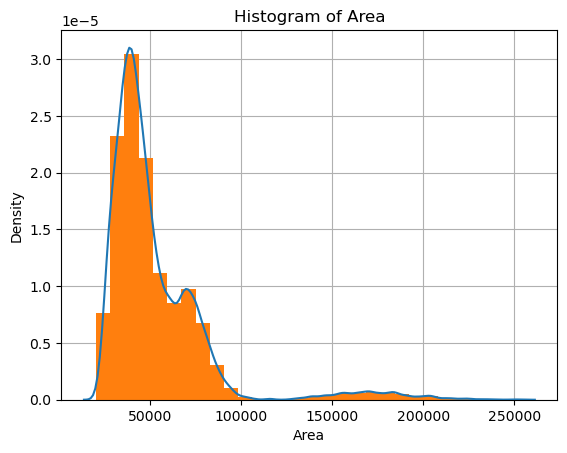

In [96]:
plt.title('Histogram of Area')
sns.kdeplot(df['Area'], bw_adjust=0.5, zorder=3)
plt.hist(df['Area'], density=True, bins=30, zorder=2)
plt.grid(zorder=1)
plt.show()

In [97]:
np.sum(df['Area'] > 120_000) / df.shape[0]

0.038204393505253106

{'whiskers': [<matplotlib.lines.Line2D at 0x136a998dfd0>,
 'caps': [<matplotlib.lines.Line2D at 0x136a998d2b0>,
 'boxes': [<matplotlib.lines.Line2D at 0x136a998f5c0>],
 'medians': [<matplotlib.lines.Line2D at 0x136a998ccb0>],
 'fliers': [<matplotlib.lines.Line2D at 0x136a970aa50>],
 'means': []}

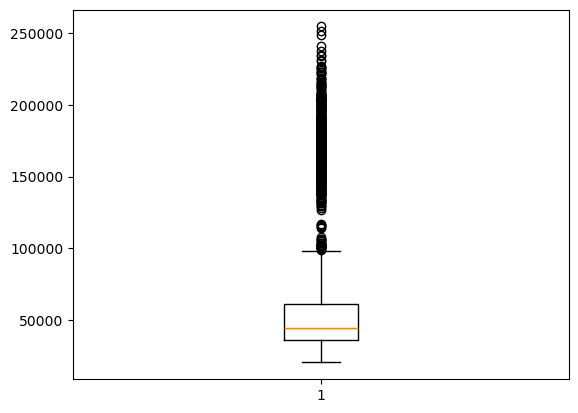

In [98]:
plt.boxplot(df['Area'])

<Axes: xlabel='Area'>

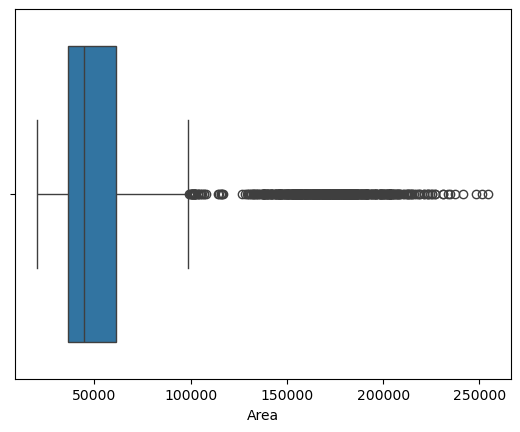

In [99]:
sns.boxplot(x='Area', data=df)

In [100]:
df['Extent'].value_counts()

Extent
0.777909    2
0.819059    2
0.736951    2
0.725921    2
0.715386    2
           ..
0.760034    1
0.779179    1
0.658562    1
0.702381    1
0.770321    1
Name: count, Length: 13529, dtype: int64

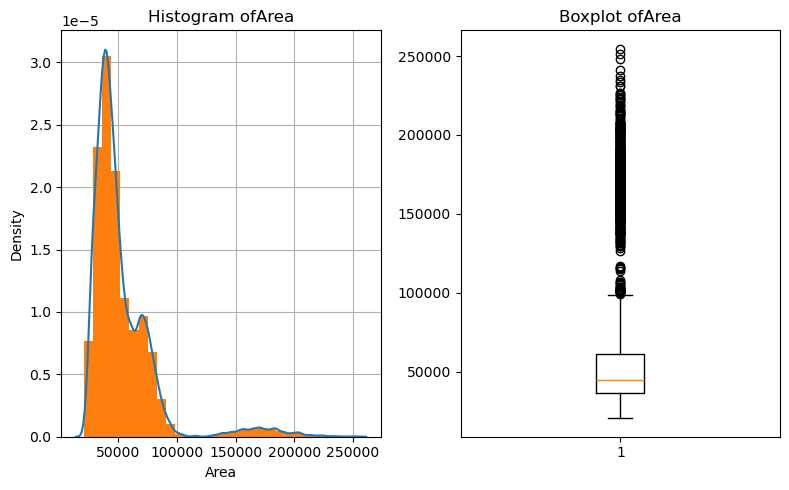

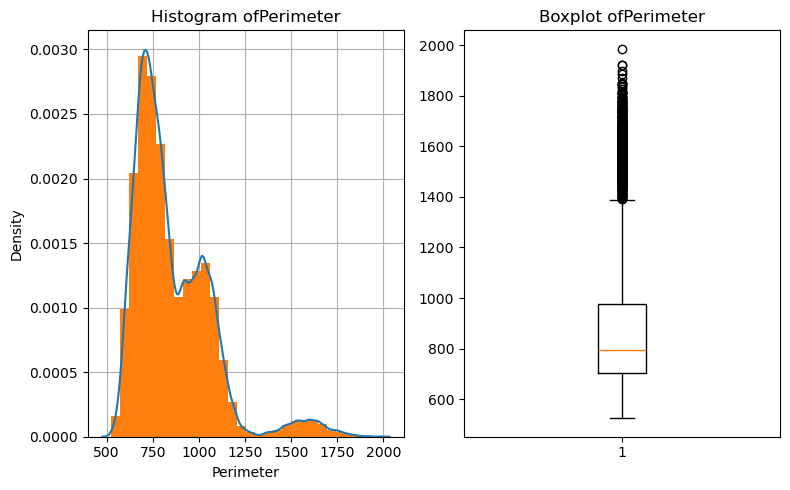

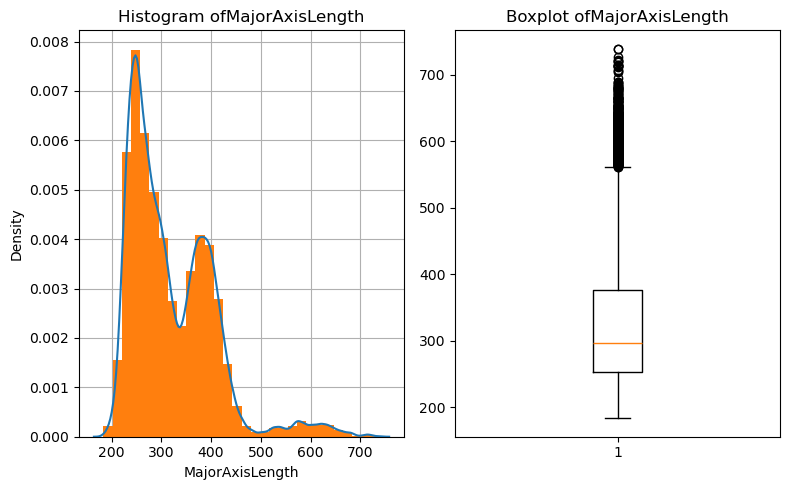

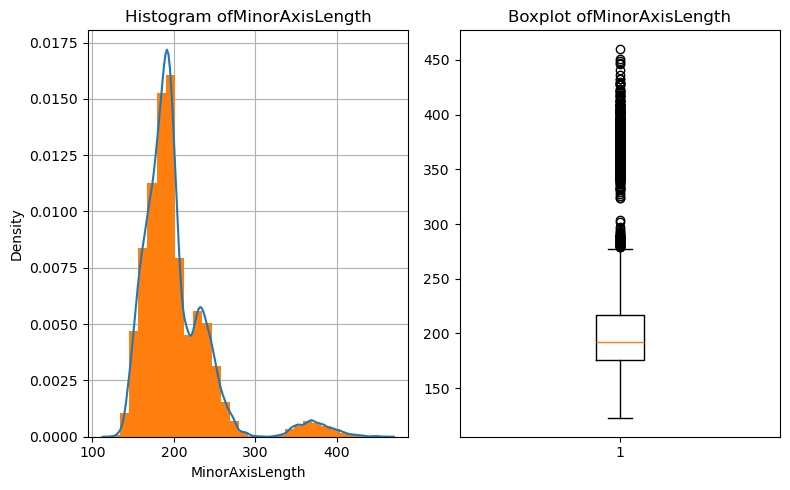

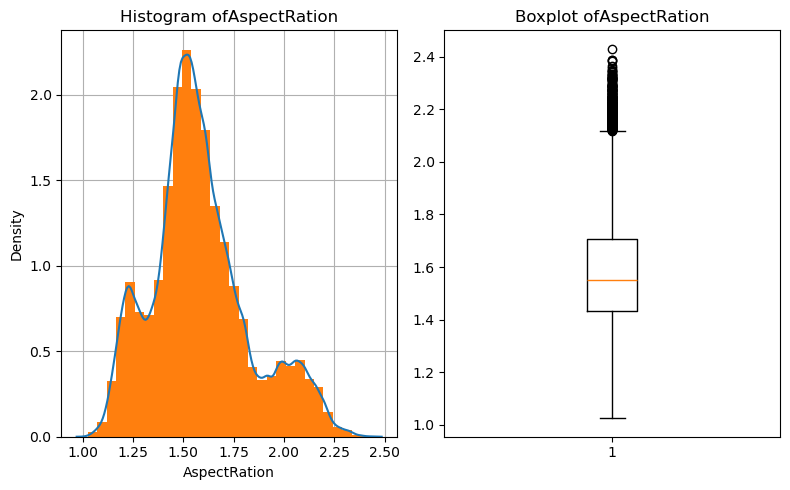

...

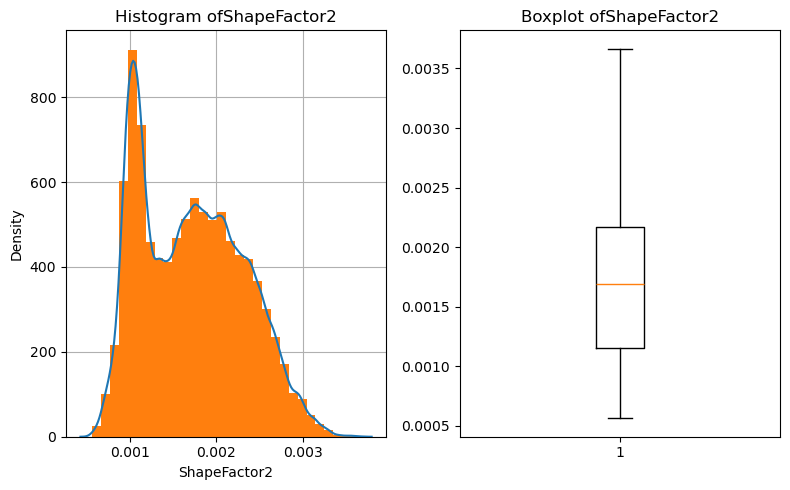

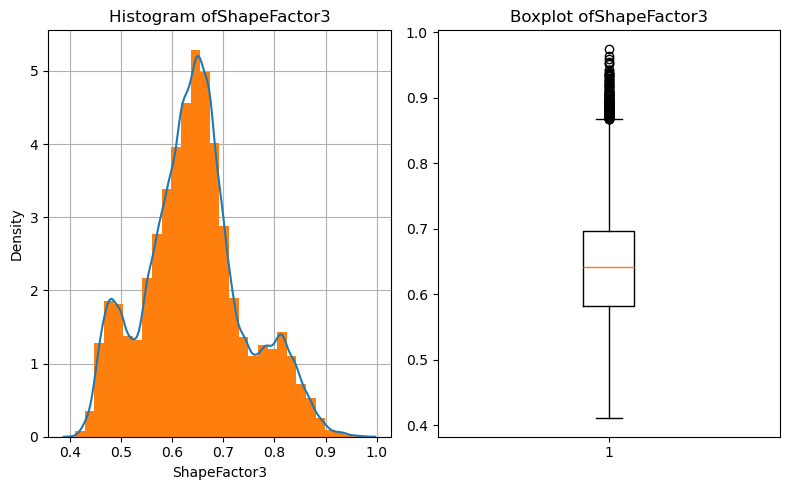

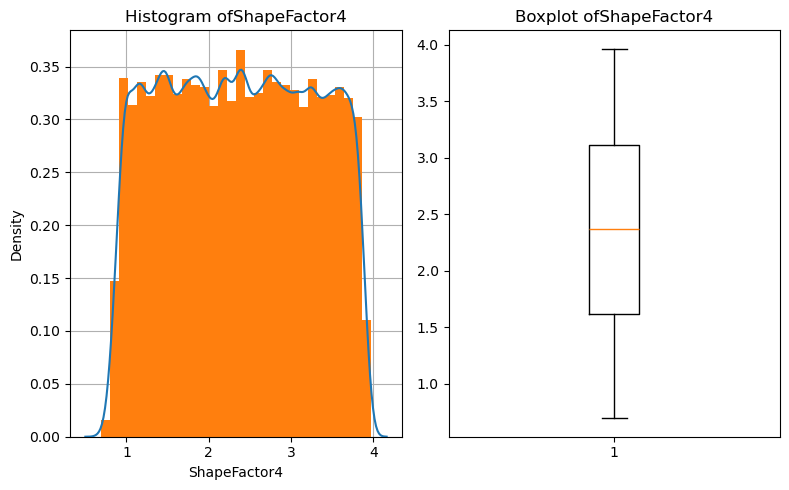

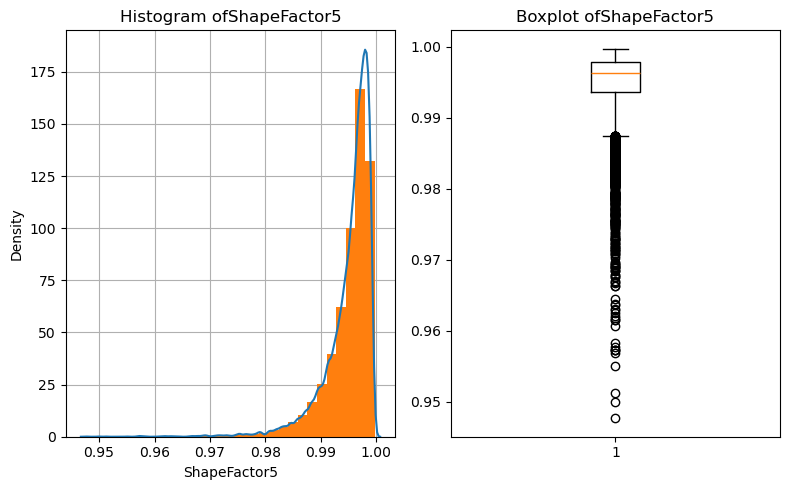

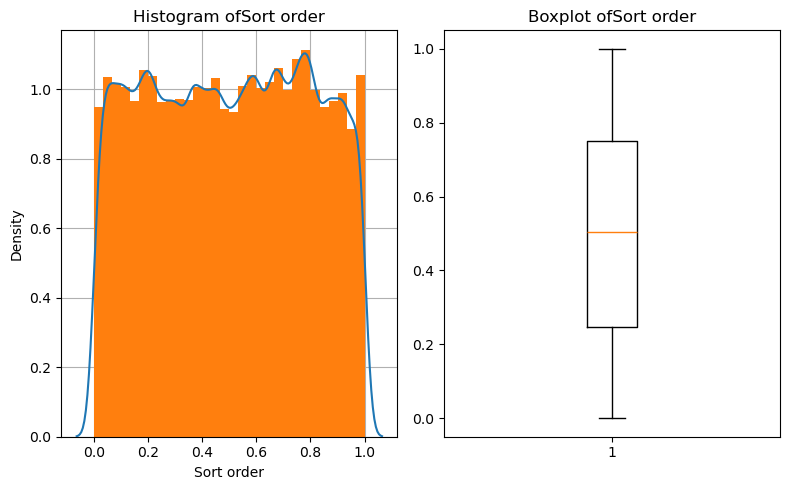

c:\Users\adkot\anaconda3\envs\env_ml4\Lib\site-packages\numpy\lib\histograms.py:825: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
c:\Users\adkot\anaconda3\envs\env_ml4\Lib\site-packages\numpy\lib\histograms.py:826: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
c:\Users\adkot\anaconda3\envs\env_ml4\Lib\site-packages\matplotlib\cbook.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
c:\Users\adkot\anaconda3\envs\env_ml4\Lib\site-packages\matplotlib\cbook.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
c:\Users\adkot\anaconda3\envs\env_ml4\Lib\site-packages\matplotlib\cbook.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
c:\Users\adkot\anaconda3\envs\env_ml4\Lib\site-packages\matplotlib\cbook.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


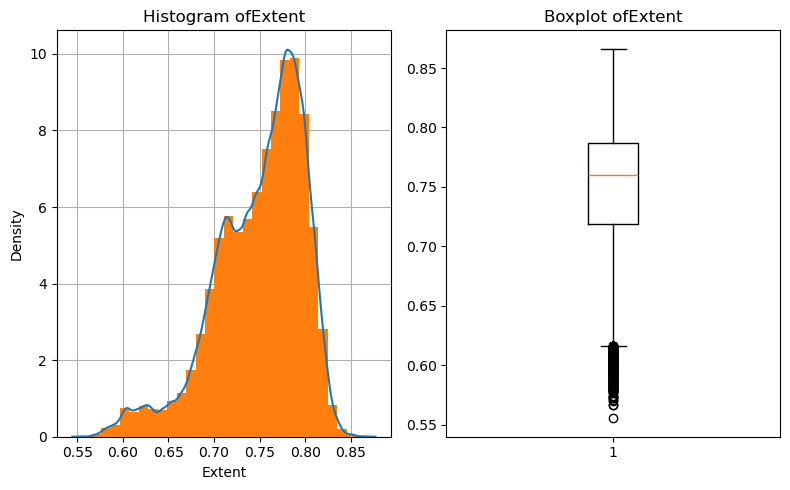

c:\Users\adkot\anaconda3\envs\env_ml4\Lib\site-packages\numpy\lib\histograms.py:825: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
c:\Users\adkot\anaconda3\envs\env_ml4\Lib\site-packages\numpy\lib\histograms.py:826: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
c:\Users\adkot\anaconda3\envs\env_ml4\Lib\site-packages\matplotlib\cbook.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
c:\Users\adkot\anaconda3\envs\env_ml4\Lib\site-packages\matplotlib\cbook.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
c:\Users\adkot\anaconda3\envs\env_ml4\Lib\site-packages\matplotlib\cbook.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
c:\Users\adkot\anaconda3\envs\env_ml4\Lib\site-packages\matplotlib\cbook.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


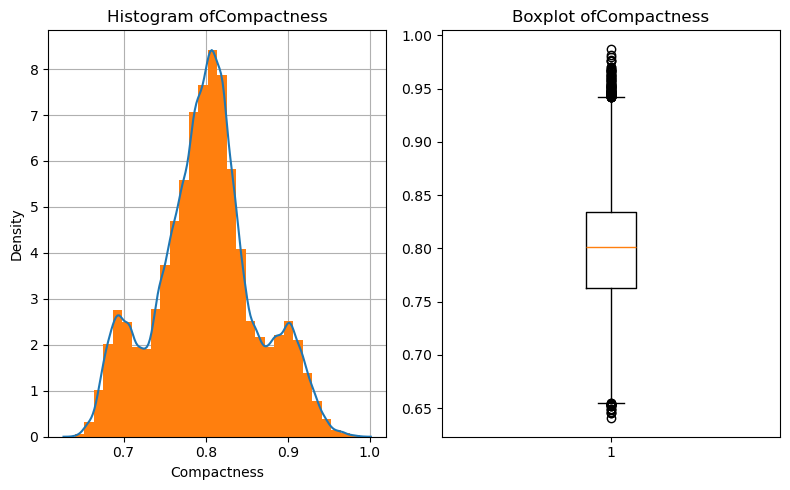

c:\Users\adkot\anaconda3\envs\env_ml4\Lib\site-packages\numpy\lib\histograms.py:825: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
c:\Users\adkot\anaconda3\envs\env_ml4\Lib\site-packages\numpy\lib\histograms.py:826: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
c:\Users\adkot\anaconda3\envs\env_ml4\Lib\site-packages\matplotlib\cbook.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
c:\Users\adkot\anaconda3\envs\env_ml4\Lib\site-packages\matplotlib\cbook.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
c:\Users\adkot\anaconda3\envs\env_ml4\Lib\site-packages\matplotlib\cbook.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
c:\Users\adkot\anaconda3\envs\env_ml4\Lib\site-packages\matplotlib\cbook.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


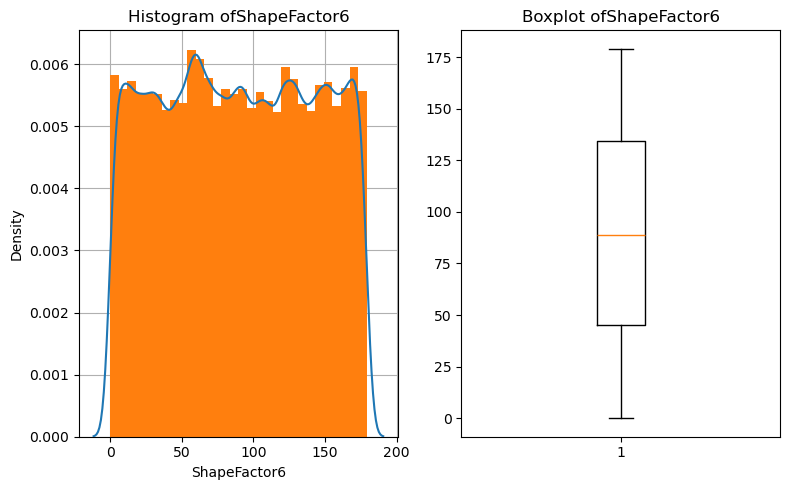

In [101]:
for numerical_feature in numerical_columns:
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(8, 5))
    data = df[numerical_feature][df[numerical_feature]!='?']

    ax = ax.flatten()
    ax[0].set_title('Histogram of' + numerical_feature)
    sns.kdeplot(data, bw_adjust=0.5, zorder=3, ax=ax[0])
    ax[0].hist(data, density=True, bins=30, zorder=2)
    ax[0].grid(zorder=1)
    
    ax[1].set_title('Boxplot of' + numerical_feature)
    ax[1].boxplot(data)
    plt.tight_layout()
    plt.show()

In [102]:
df['ConvexArea'].describe()

count     13611.000000
mean      53765.692602
std       29778.009358
min         -30.000000
25%       36714.500000
50%       45178.000000
75%       62294.000000
max      263261.000000
Name: ConvexArea, dtype: float64

In [103]:
df['ConvexArea'][df['ConvexArea'] < 0]

3941   -30
Name: ConvexArea, dtype: int64

In [104]:
numerical_columns

['Area',
 'Perimeter',
 'MajorAxisLength',
 'MinorAxisLength',
 'AspectRation',
 'Eccentricity',
 'ConvexArea',
 'EquivDiameter',
 'Solidity',
 'roundness',
 'ShapeFactor1',
 'ShapeFactor2',
 'ShapeFactor3',
 'ShapeFactor4',
 'ShapeFactor5',
 'Sort order',
 'Extent',
 'Compactness',
 'ShapeFactor6']

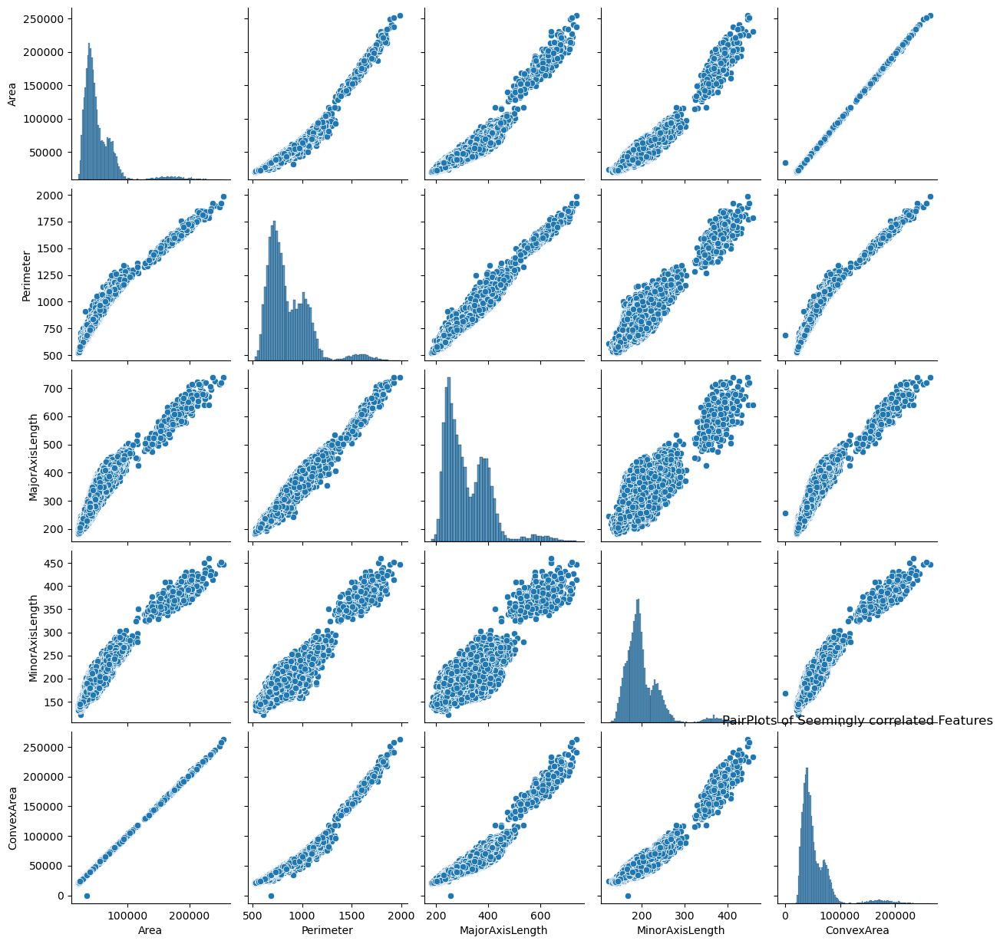

In [105]:
sns.pairplot(df[['Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLength', 'ConvexArea']])
plt.title('PairPlots of Seemingly correlated Features')
plt.show()


<Axes: >

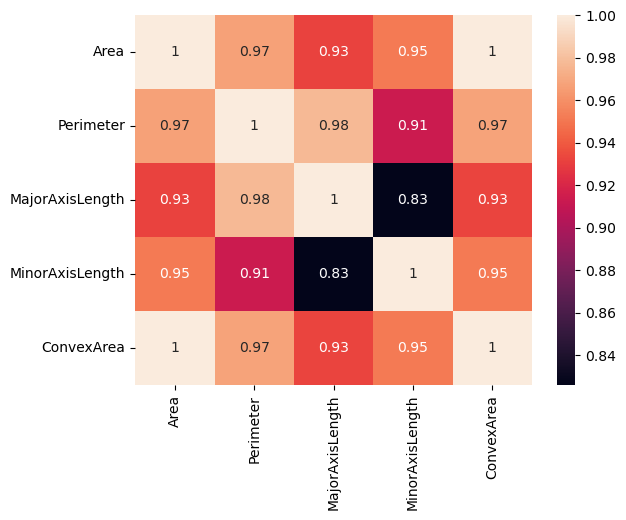

In [106]:
sns.heatmap(df[['Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLength', 'ConvexArea']].corr(), annot=True)

In [107]:
df['EquivDiameter'].value_counts()

EquivDiameter
244.975249    4
227.093141    4
221.524713    4
221.191100    4
210.417756    4
             ..
283.191700    1
193.651037    1
254.788915    1
266.732224    1
285.983465    1
Name: count, Length: 12012, dtype: int64

(array([  1.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,  10.,  38., 111., 198., 347.,
        396., 495., 545., 680., 757., 848., 884., 855., 754., 705., 619.,
        532., 406., 377., 315., 315., 286., 277., 361., 357., 336., 346.,
        252., 214., 164., 116.,  74.,  53.,  30.,  12.,  11.,   5.,   1.,
          1.,   5.,   0.,   0.,   2.,   5.,   9.,  14.,  15.,  22.,  18.,
         28.,  30.,  33.,  38.,  42.,  35.,  33.,  40.,  33.,  24.,  15.,
         18.,  22.,  10.,  10.,   5.,   6.,   4.,   3.,   2.,   1.,   1.,
          2.]),
 array([1.61417391e-01, 5.85354680e+00, 1.15456762e+01, 1.72378056e+01,
        2.29299350e+01, 2.86220644e+01, 3.43141938e+01, 4.00063233e+01,
        4.56984527e+01, 5.13905821e+01, 5.70827115e+01, 6.27748409e+01,
        6.84669703e+01, 7.41590997e+01, 7.98512291e+01, 8.55433585e+01,
        9.12354879e+01, 9.6927

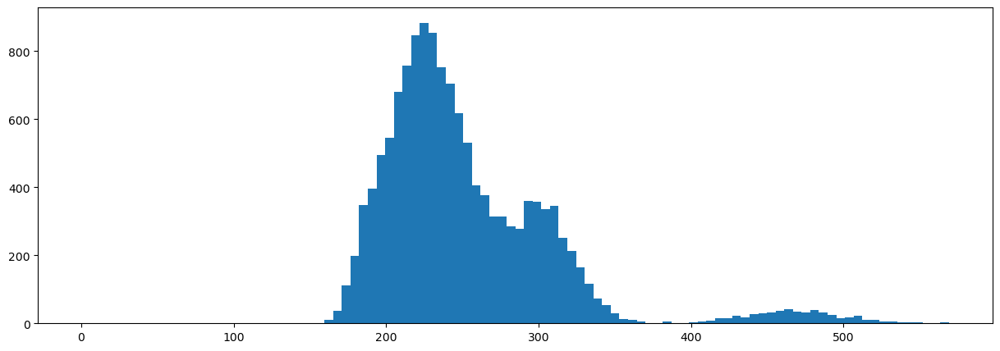

In [108]:
plt.figure(figsize=(15, 5))
plt.hist(df['EquivDiameter'][df['EquivDiameter'] < 1000], bins=100)

In [109]:
df.shape[0]

13611

In [110]:
sum(df['EquivDiameter'] < 10000)

13609

In [24]:
df_numerical_without_missing_values = df[numerical_columns][np.sum((df[numerical_columns]=='?'), axis=1) == 0]

In [25]:
df_numerical_without_missing_values.shape

(13611, 19)

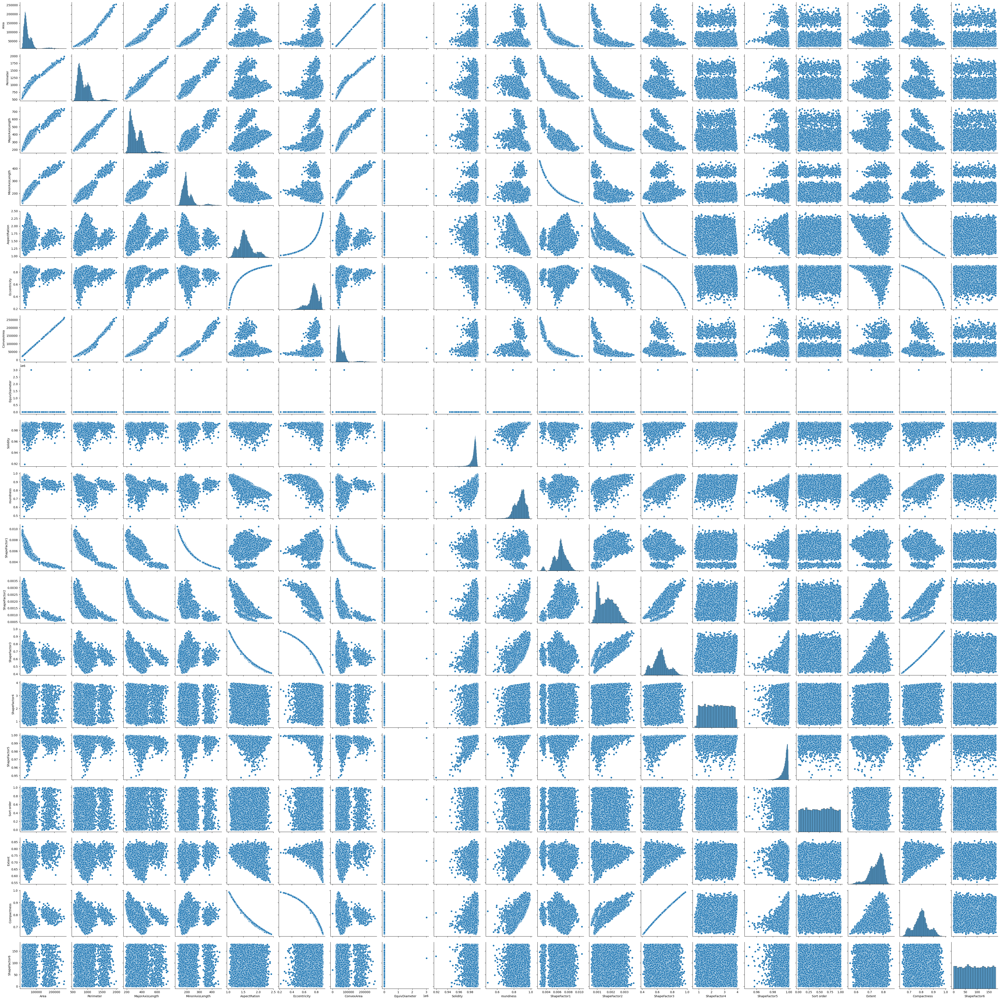

In [113]:
sns.pairplot(df_numerical_without_missing_values)

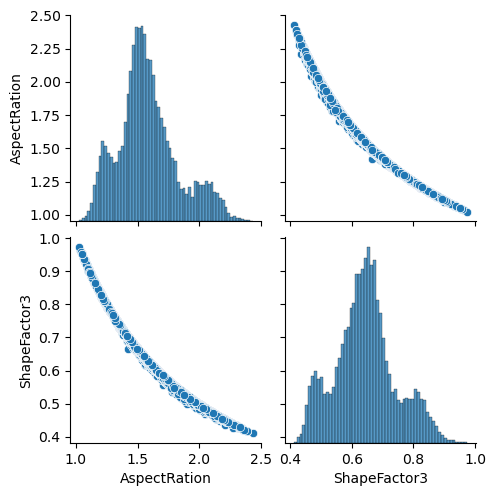

In [117]:
sns.pairplot(df[['AspectRation', 'ShapeFactor3']])

In [27]:
np.corrcoef(np.c_[df['AspectRation'], 1/df['ShapeFactor3']].T )   

array([[1.        , 0.99961232],
       [0.99961232, 1.        ]])

In [25]:
numerical_columns

['Area',
 'Perimeter',
 'MajorAxisLength',
 'MinorAxisLength',
 'AspectRation',
 'Eccentricity',
 'ConvexArea',
 'EquivDiameter',
 'Solidity',
 'roundness',
 'ShapeFactor1',
 'ShapeFactor2',
 'ShapeFactor3',
 'ShapeFactor4',
 'ShapeFactor5',
 'Sort order',
 'Extent',
 'Compactness',
 'ShapeFactor6']

In [26]:
df_numerical = df[numerical_columns].copy()
df_categorical = df[categorical_columns].copy()

In [27]:
df_numerical.head()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Solidity,roundness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,ShapeFactor5,Sort order,Extent,Compactness,ShapeFactor6
0,84648,1132.054,439.915710,248.961941,1.767000,0.824453,86779,328.294351,0.975443,0.830027,0.005197,0.000994,0.556914,3.487008,0.984066,0.134791,0.767184,0.746266,50.809833
1,39704,736.873,271.659919,186.481404,1.456767,0.727175,40106,224.839282,0.989977,0.918880,0.006842,0.001980,0.685004,1.242335,0.997891,0.898848,0.757739,0.82765,148.508874
2,35835,687.914,237.704180,192.176759,1.236904,0.588537,36190,213.603696,0.990191,0.951588,0.006633,0.002668,0.807503,2.813489,0.998803,0.539684,0.790885,0.898611,82.107117
3,223035,1817.278,680.812555,419.994347,1.621004,0.787040,225889,532.894907,0.987365,0.848673,0.003052,0.000707,0.612672,3.074472,0.993144,0.149130,0.761092,0.782734,147.347735
4,41957,767.143,287.962974,186.166695,1.546802,0.762918,42310,231.130508,0.991657,0.895904,0.006863,0.001757,0.644230,2.213954,0.996497,0.447635,0.721543,0.80264,22.893826


In [28]:
for x in df_numerical.columns:
    if 'Area' in x:
        df_numerical[x] = df_numerical[x].astype(int)
    else:
        df_numerical[x] = df_numerical[x].astype(float)

In [29]:
df_categorical.head()

,Colour,Class,Constantness
0,brown,CALI,1
1,black,DERMASON,1
2,green,SEKER,1
3,brown,BOMBAY,1
4,brown,SIRA,1


In [30]:
df_categorical['Colour'].value_counts()

Colour
brown    6115
black    3541
green    2023
white    1926
Name: count, dtype: int64

In [31]:
df_categorical['Constantness'].value_counts()

Constantness
1    12289
0     1322
Name: count, dtype: int64

In [32]:
df_categorical.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13611 entries, 0 to 13610
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Colour        13605 non-null  object
 1   Class         13594 non-null  object
 2   Constantness  13611 non-null  int64 
dtypes: int64(1), object(2)
memory usage: 319.1+ KB


In [33]:
for x in df_categorical.columns:
    df_categorical[x] = df_categorical[x].astype('object')

In [34]:
categorical_columns.remove('Class')
categorical_columns = categorical_columns + ['Class']
df_categorical = df_categorical[categorical_columns]
df_categorical.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13611 entries, 0 to 13610
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Colour        13605 non-null  object
 1   Constantness  13611 non-null  object
 2   Class         13594 non-null  object
dtypes: object(3)
memory usage: 319.1+ KB


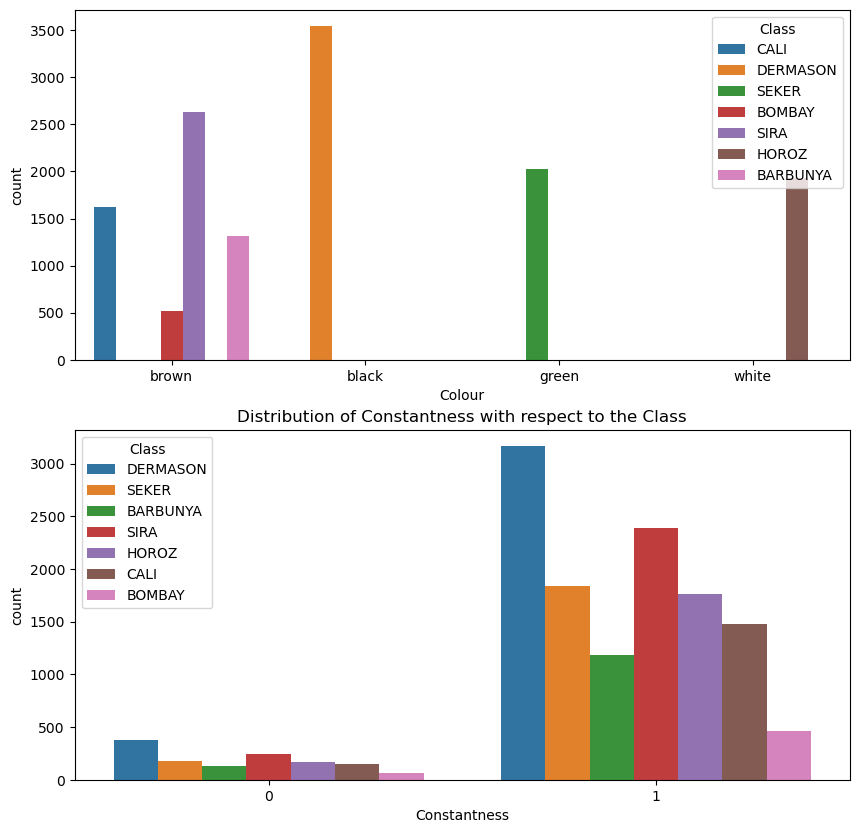

In [35]:
fig, ax = plt.subplots(nrows=2, ncols=1, figsize=(10, 10))
ax = ax.flatten()
for i, x in enumerate(df_categorical.columns[:-1]):
    plt.title(f'Distribution of {x} with respect to the Class')
    sns.countplot(x=x, hue='Class', data=df_categorical, ax=ax[i])
plt.show()

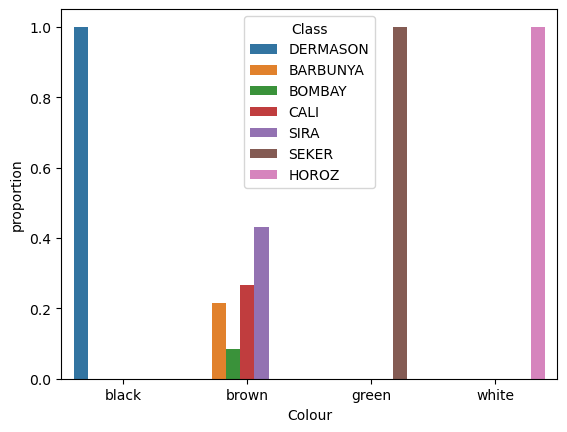

In [36]:
# to get the  distributions
df_colour_class = df_categorical.groupby(['Colour', 'Class']).size().reset_index(name='Count')
df_totals = df_categorical.groupby('Colour').size().reset_index(name='total_count')
df_proportion = pd.merge(df_colour_class, df_totals, on='Colour')
df_proportion['proportion'] = df_proportion['Count'] / df_proportion['total_count']
sns.barplot(x='Colour', y='proportion', hue='Class', data=df_proportion)
plt.show()

Thus we see that colour is a very good indicator of the class

In [37]:
# df['EquivDiameter'][df['EquivDiameter'] > 10000] = np.nan
# df_numerical['EquivDiameter'][df_numerical['EquivDiameter'] > 10000] = np.nan
# df.drop(['ConvexArea', 'MinorAxisLength', 'MajorAxisLength', 'Perimeter', 'Eccentricity', 'ShapeFactor3', 'Compactness'], axis=1, inplace=True)
# df_numerical.drop(['ConvexArea', 'MinorAxisLength', 'MajorAxisLength', 'Perimeter', 'Eccentricity', 'ShapeFactor3', 'Compactness'], axis=1, inplace=True)
# sns.pairplot(df_numerical, plot_kws={'alpha': 0.1})
# # Since equiv diameter is correlated with area it is removed
# df.drop(['EquivDiameter'], axis=1, inplace=True)
# df_numerical.drop(['EquivDiameter'], axis=1, inplace=True)
# sns.pairplot(df_numerical, plot_kws={'alpha': 0.1})
# plt.figure(figsize=(10, 10))
# sns.heatmap(df_numerical.corr(), annot=True)
# # Variance Inflation Factors
# import statsmodels.api as sm
# from statsmodels.stats.outliers_influence import variance_inflation_factor
# df_copy = df_numerical[np.sum(df_numerical.isna(), axis=1) == 0].copy()
# df_copy = sm.add_constant(df_copy)

# vif_data = pd.DataFrame()
# vif_data['feature'] = df_copy.columns
# vif_data['VIF'] = [variance_inflation_factor(df_copy.values, i) for i in range(df_copy.shape[1])]

# plt.figure(figsize=(20, 10))
# sns.barplot(y="VIF", x="feature", data=vif_data.iloc[1:, :], palette="viridis", zorder=2)
# plt.title('Variance Inflation Factors (VIF) for Features')
# plt.xlabel('VIF')
# plt.ylabel('Feature')
# plt.ylim([0, 20])
# plt.grid(zorder=1)
# plt.show()
# #Shape factor 2 will be removed because of VIF above 10
# df.drop(['ShapeFactor2'], axis=1, inplace=True)
# df_numerical.drop(['ShapeFactor2'], axis=1, inplace=True)
# df_copy = df_numerical[np.sum(df_numerical.isna(), axis=1) == 0].copy()
# df_copy = sm.add_constant(df_copy)

# vif_data = pd.DataFrame()
# vif_data['feature'] = df_copy.columns
# vif_data['VIF'] = [variance_inflation_factor(df_copy.values, i) for i in range(df_copy.shape[1])]

# plt.figure(figsize=(20, 10))
# sns.barplot(y="VIF", x="feature", data=vif_data.iloc[1:, :], palette="viridis", zorder=2)
# plt.title('Variance Inflation Factors (VIF) for Features')
# plt.xlabel('VIF')
# plt.ylabel('Feature')
# plt.ylim([0, 10])
# plt.grid(zorder=1)
# plt.show()

# 2.Characterize all the features of the dataset

In [35]:
def _get_second_mode(df: pd.DataFrame):
    return [list(df[x].value_counts().index)[1] for x in df.columns]


def data_quality_report_categorical(df: pd.DataFrame):
    table = df.describe(include='all').transpose()
    table['1st mode'] = table['top']
    table.drop('top', axis=1, inplace=True)
    table.drop('freq', axis=1, inplace=True)
    table['2nd mode'] = _get_second_mode(df)
    table['1st mode freq'] = (df == table['1st mode'].T).sum()
    table['2nd mode freq'] = (df == table['2nd mode'].T).sum()
    table['1st mode proportion'] = table['1st mode freq'] / len(df)
    table['2nd mode proportion'] = table['2nd mode freq'] / len(df)

    table['missing (#)'] = df.isna().sum()
    table['missing (%)'] = df.isna().mean()*100
    table.drop('unique', axis=1, inplace=True)
    table['cardinality (#)'] = df.nunique()

    return table

def data_quality_report_numerical(df: pd.DataFrame):
    table = df.describe(include='all').transpose()
    table['count'] = table['count'].astype(int)
    table['missing (#)'] = df.isna().sum()
    table['missing (%)'] = df.isna().sum() / len(df) * 100
    table['cardinality (#)'] = df.nunique()
    return round(table, 4)

In [36]:
data_quality_report_categorical(df_categorical)

,count,1st mode,2nd mode,1st mode freq,2nd mode freq,1st mode proportion,2nd mode proportion,missing (#),missing (%),cardinality (#)
Colour,13605,brown,black,6115,3541,0.449269,0.260157,6,0.044082,4
Constantness,13611,1,0,12289,1322,0.902873,0.097127,0,0.000000,2
Class,13594,DERMASON,SIRA,3542,2634,0.260231,0.193520,17,0.124899,7


In [37]:
data_quality_report_numerical(df_numerical)

,count,mean,std,min,25%,50%,75%,max,missing (#),missing (%),cardinality (#)
Area,13611,53048.2845,29324.0957,20420.0000,36328.0000,44652.0000,61332.0000,2.546160e+05,0,0.0000,12011
Perimeter,13611,855.2835,214.2897,524.7360,703.5235,794.9410,977.2130,1.985370e+03,0,0.0000,13351
MajorAxisLength,13611,320.1419,85.6942,183.6012,253.3036,296.8834,376.4950,7.388602e+02,0,0.0000,13543
MinorAxisLength,13611,202.2707,44.9701,122.5127,175.8482,192.4317,217.0317,4.601985e+02,0,0.0000,13543
AspectRation,13611,1.5832,0.2467,1.0249,1.4323,1.5511,1.7071,2.430300e+00,0,0.0000,13543
Eccentricity,13611,0.7509,0.0920,0.2190,0.7159,0.7644,0.8105,9.114000e-01,0,0.0000,13543
ConvexArea,13611,53765.6926,29778.0094,-30.0000,36714.5000,45178.0000,62294.0000,2.632610e+05,0,0.0000,12066
EquivDiameter,13611,476.2541,25836.8656,0.1614,215.0680,238.4380,279.4522,3.014441e+06,0,0.0000,12012
Solidity,13611,0.9871,0.0047,0.9192,0.9857,0.9883,0.9900,9.947000e-01,0,0.0000,13526
roundness,13611,0.8733,0.0595,0.4896,0.8321,0.8832,0.9169,9.907000e-01,0,0.0000,13543


There is clearly outliers and and missing values. The scales of the features are not the similar, for knn the variables need to standardized.

## 3. Identifying Data Qaulity Issues with justification

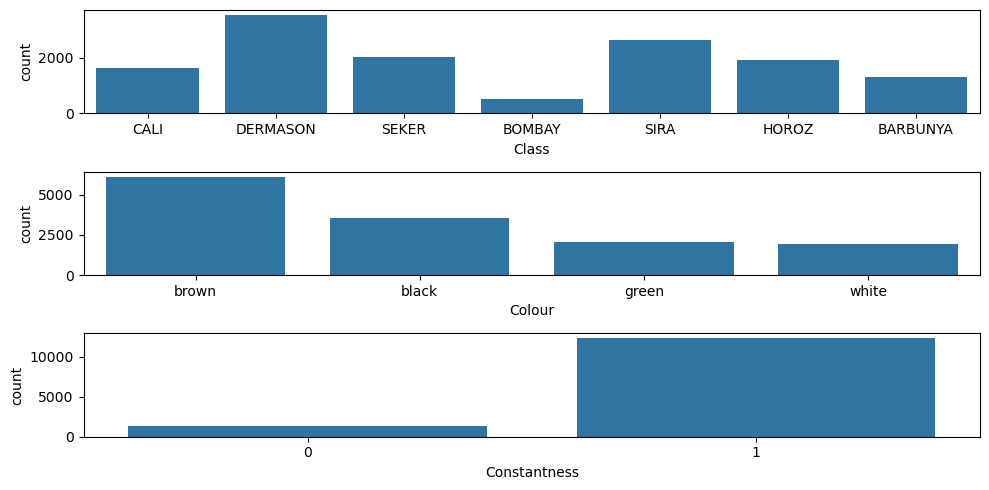

In [40]:
# histogram for each categorical feature
plt.figure(figsize=(10, 5))
plt.subplot(3, 1, 1)
sns.countplot(x='Class', data=df_categorical)
plt.xlabel('Class')

plt.subplot(3, 1, 2)
sns.countplot(x='Colour',  data=df_categorical)
plt.xlabel('Colour')

plt.subplot(3, 1, 3)
sns.countplot(x='Constantness', data=df_categorical)
plt.xlabel('Constantness')
plt.tight_layout()
plt.show()


In [41]:
# missing values
df[np.sum(df.isna(), axis=1) > 0][['Extent', 'Compactness', 'ShapeFactor6', 'Colour', 'Class']]

,Extent,Compactness,ShapeFactor6,Colour,Class
6,0.81292,0.693508,25.541389,brown,NaN
104,0.678398,NaN,99.847826,brown,SIRA
118,0.756957,0.801302,126.833659,brown,NaN
436,0.689218,0.786581,111.802204,brown,NaN
484,0.680053,NaN,103.156493,brown,CALI
788,0.763723,NaN,72.216663,white,HOROZ
902,0.753663,NaN,93.499108,black,DERMASON
935,0.784209,0.828304,55.089332,brown,NaN
1164,0.762552,0.817321,48.194068,brown,NaN
1175,0.786411,0.909771,66.211289,NaN,SEKER


Data Quality Issue 1: Missing values.
Input variables Extent, Compacteness, ShapeFactor6 and Colour have missing values
Input variables: It is an issue because it indicates that information is missing the models use train.
Response variable: It is an issuee because the classes to which the observations belong is unknown and therefore it cannot be known if those observations is classified correctly or incorrecly by the models.

Data Quality Issue 2: Outliers.
Most of box plots of the numerical features shows to have valid outliers. This is minorly problamatic sinc they are valid observations of the marginal distributions, but however doesnt give clear indication of the centrality of the distribution.
However EquivDiameter seems to have two invalid outliers, due to how far they are from the rest of the population. This is then for all practical purposes a missing value, since there true values is unknown.

Data Qaulity Issue 3: Collinerity
From the numerical pairplot we see that many features have have high linear relationships. This means that given one feature the other featrue can be approximated with a linear transformation. Meaning that the information of one of the features are redundant and leaving the feature in the dataset can lead to overfitting and increase computational complexity in moddeling.

Data Qaulity Issue 4: Non-linear relationship between features. 
From the numerical pairplot we see that there are some perfect non-linear relationship between two features. The value of one of the two features can be used to aproximate the value of another feature with a nonlinear transformation this also indicated that the information in one of the features is redundant and can lead to overfitting and computational complexity in modelling.

Data Quality Issue 4: Multicolinearity
From the VIF scores we can see scores of more than 10 which should be removed because it can also increase the comlexity of the model and lead to overfitting.

Data Qaulity Issye 5: Class imbalances.
This can lead to a model being biased to majority classes which can lead to the model performing well on the majority class and not so much on the minority class.


### Handling the Data Qaulity Issues

In [38]:
# Consider invalid outliers of EquivDiameter as misssing values
df['EquivDiameter'][df['EquivDiameter'] > 10000] = np.nan
df['ConvexArea'][df['ConvexArea'] < 0] = np.nan
df_numerical['EquivDiameter'][df_numerical['EquivDiameter'] > 10000] = np.nan
df_numerical['ConvexArea'][df_numerical['ConvexArea'] < 0] = np.nan

# From the first pair plot we see the a lot of correlations above 0.95. These features will be removed.
df.drop(['ConvexArea', 'MinorAxisLength', 'MajorAxisLength', 'Perimeter', 'Eccentricity', 'ShapeFactor3', 'Compactness'], axis=1, inplace=True)
df_numerical.drop(['ConvexArea', 'MinorAxisLength', 'MajorAxisLength', 'Perimeter', 'Eccentricity', 'ShapeFactor3', 'Compactness'], axis=1, inplace=True)

C:\Users\adkot\AppData\Local\Temp\ipykernel_15884\2695749753.py:2: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df['EquivDiameter'][df['EquivDiameter'] > 10000] = np.nan
C:\Users\adkot\AppData\Local\Temp\ipykernel_15884\2695749753.py:2: Set

In [ ]:
sns.pairplot(df_numerical, plot_kws={'alpha': 0.1})

In [39]:
# Since equiv diameter is correlated with area it is removed
df.drop(['EquivDiameter'], axis=1, inplace=True)
df_numerical.drop(['EquivDiameter'], axis=1, inplace=True)

In [ ]:
sns.pairplot(df_numerical, plot_kws={'alpha': 0.1})
plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

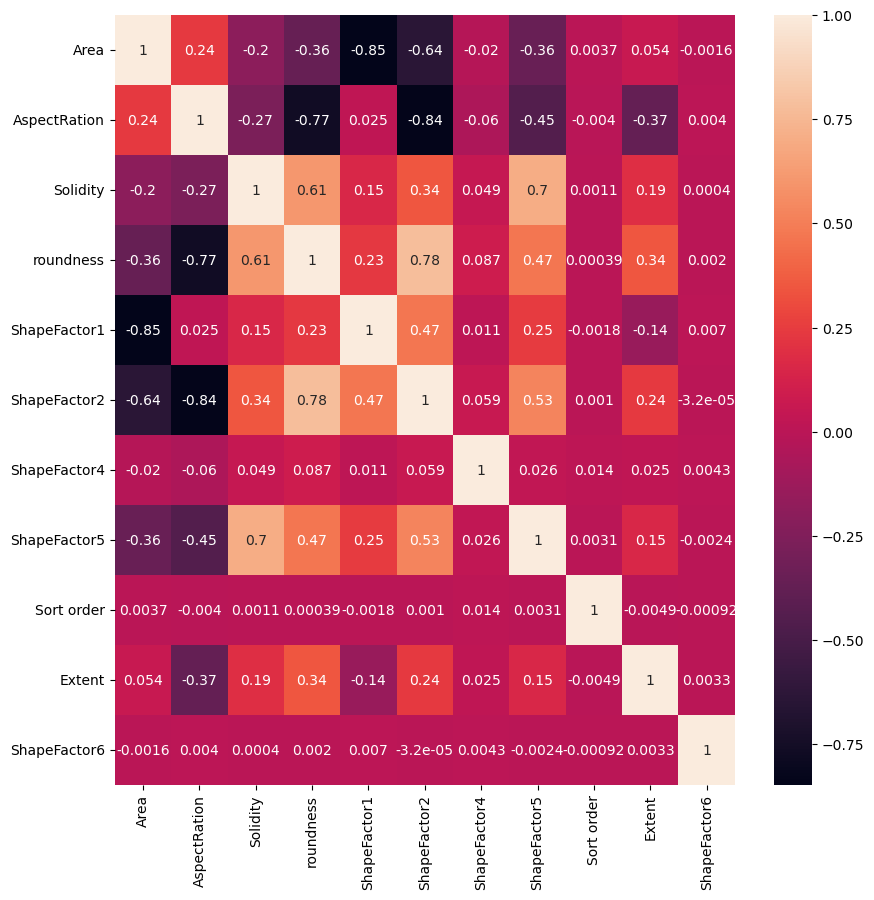

In [108]:
plt.figure(figsize=(10, 10))
sns.heatmap(df_numerical.corr(), annot=True)
plt.show

We see that the correlations are all below 0.95 as required. We will now consider multicolinearity

C:\Users\adkot\AppData\Local\Temp\ipykernel_15884\1136253335.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y="VIF", x="feature", data=vif_data.iloc[1:, :], palette="viridis", zorder=2)


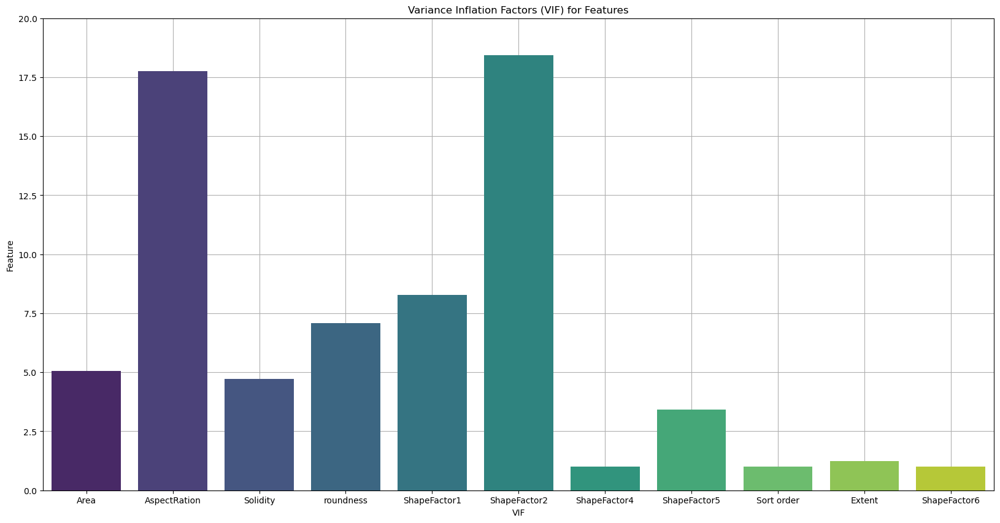

In [40]:
# Variance Inflation Factors
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
df_copy = df_numerical[np.sum(df_numerical.isna(), axis=1) == 0].copy()
df_copy = sm.add_constant(df_copy)

vif_data = pd.DataFrame()
vif_data['feature'] = df_copy.columns
vif_data['VIF'] = [variance_inflation_factor(df_copy.values, i) for i in range(df_copy.shape[1])]

plt.figure(figsize=(20, 10))
sns.barplot(y="VIF", x="feature", data=vif_data.iloc[1:, :], palette="viridis", zorder=2)
plt.title('Variance Inflation Factors (VIF) for Features')
plt.xlabel('VIF')
plt.ylabel('Feature')
plt.ylim([0, 20])
plt.grid(zorder=1)
plt.show()


C:\Users\adkot\AppData\Local\Temp\ipykernel_15884\2567653341.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y="VIF", x="feature", data=vif_data.iloc[1:, :], palette="viridis", zorder=2)


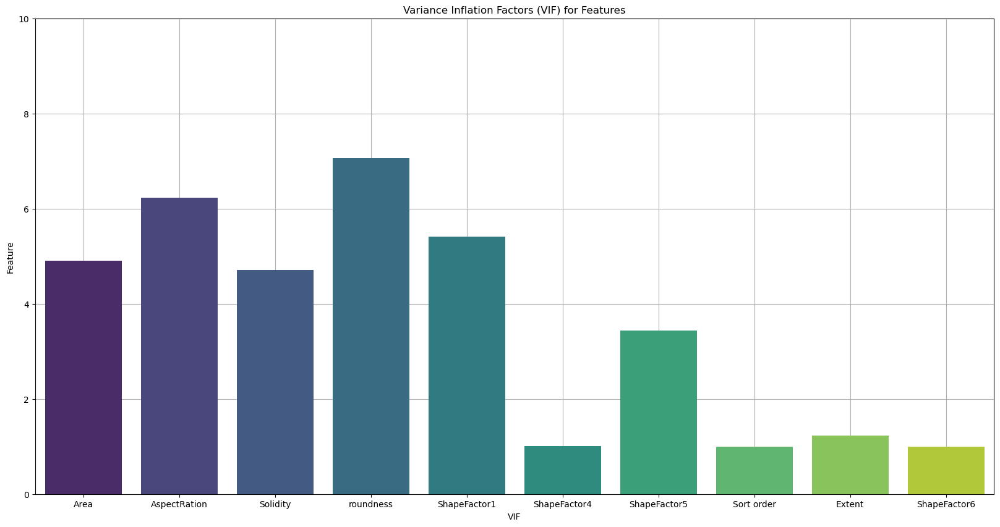

In [41]:
#Shape factor 2 will be removed because of VIF above 10
df.drop(['ShapeFactor2'], axis=1, inplace=True)
df_numerical.drop(['ShapeFactor2'], axis=1, inplace=True)
df_copy = df_numerical[np.sum(df_numerical.isna(), axis=1) == 0].copy()
df_copy = sm.add_constant(df_copy)

vif_data = pd.DataFrame()
vif_data['feature'] = df_copy.columns
vif_data['VIF'] = [variance_inflation_factor(df_copy.values, i) for i in range(df_copy.shape[1])]

plt.figure(figsize=(20, 10))
sns.barplot(y="VIF", x="feature", data=vif_data.iloc[1:, :], palette="viridis", zorder=2)
plt.title('Variance Inflation Factors (VIF) for Features')
plt.xlabel('VIF')
plt.ylabel('Feature')
plt.ylim([0, 10])
plt.grid(zorder=1)
plt.show()

We see that the VIFs are now below 10. Redundant features in the data have now been removed. KNN are sensitive to redundant features and decision trees are more computationally intensive and less interpretable in the pressence of redundant features.

In [42]:
df_categorical.head()

,Colour,Constantness,Class
0,brown,1,CALI
1,black,1,DERMASON
2,green,1,SEKER
3,brown,1,BOMBAY
4,brown,1,SIRA


In [43]:
contingency_table = pd.crosstab(df_categorical['Constantness'], df['Colour'])
contingency_table

Colour,black,brown,green,white
Constantness,,,,
0,378,593,181,168
1,3163,5522,1842,1758


In [44]:
chi2, p, dof, expected = chi2_contingency(contingency_table)

print(f'Chi-Square Statistic: {chi2}')
print(f'p-value: {p}')

Chi-Square Statistic: 7.25024347722191
p-value: 0.06433525113503369


Since the p-value for the Chi square test is greater than 0.05, the null hypothesis of no relationship is not rejected. And conclude that there is not enough evidence to conclude that there is a relationship between the two categorical variables.

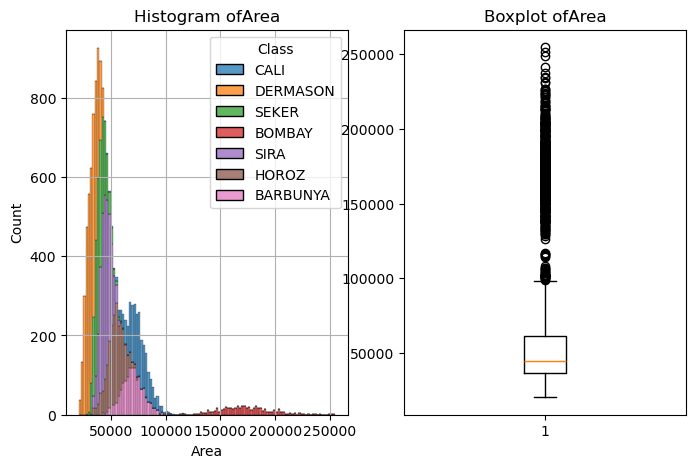

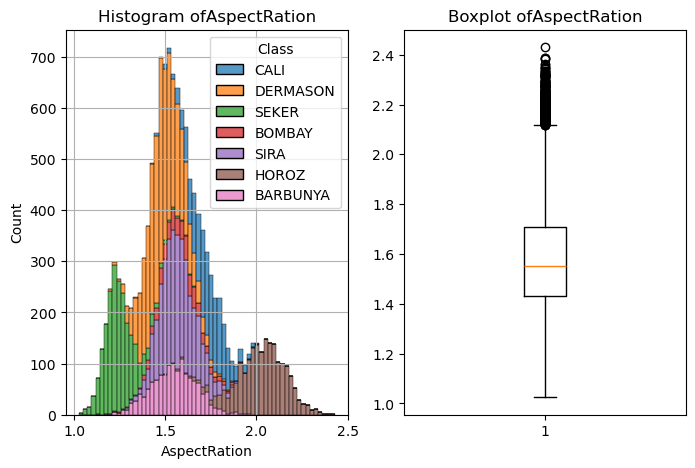

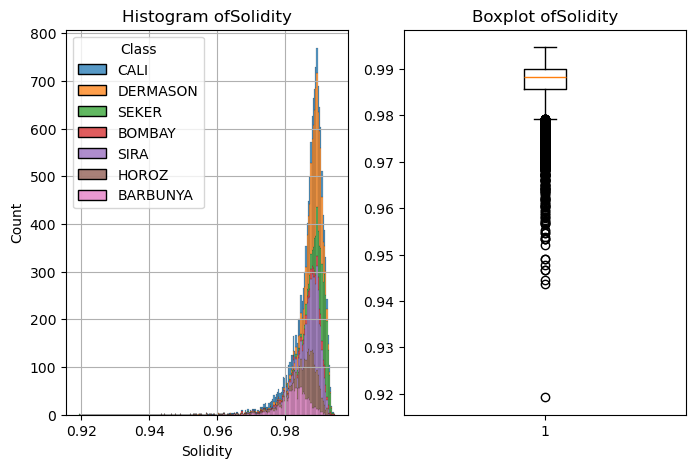

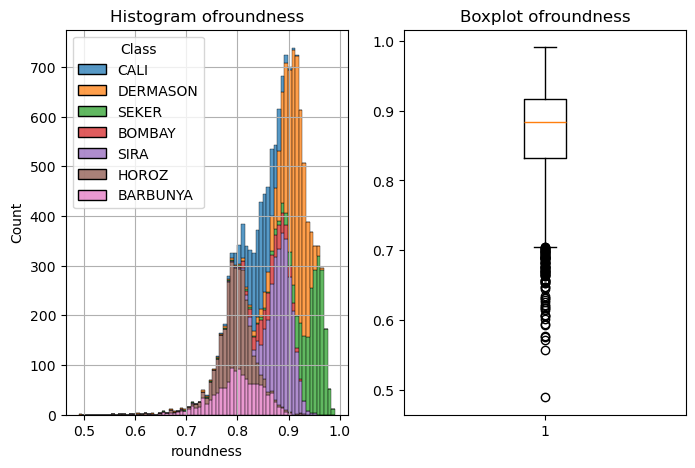

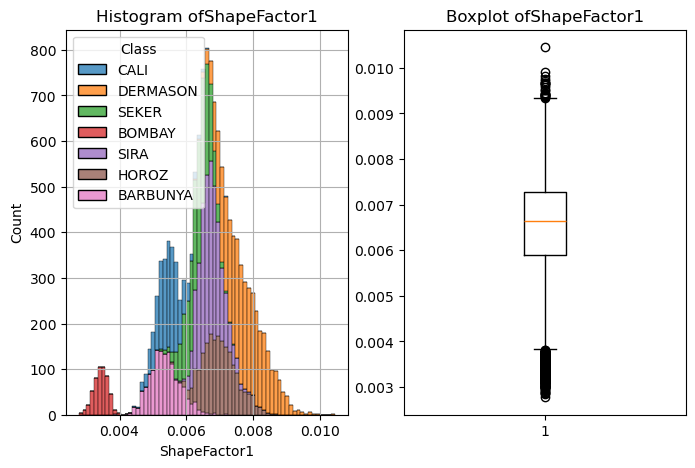

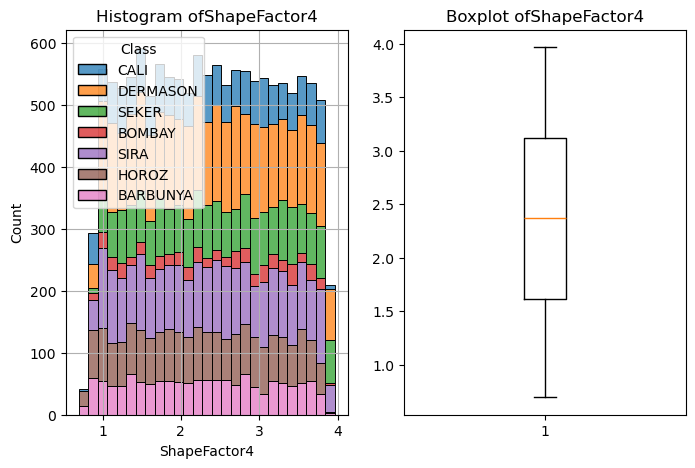

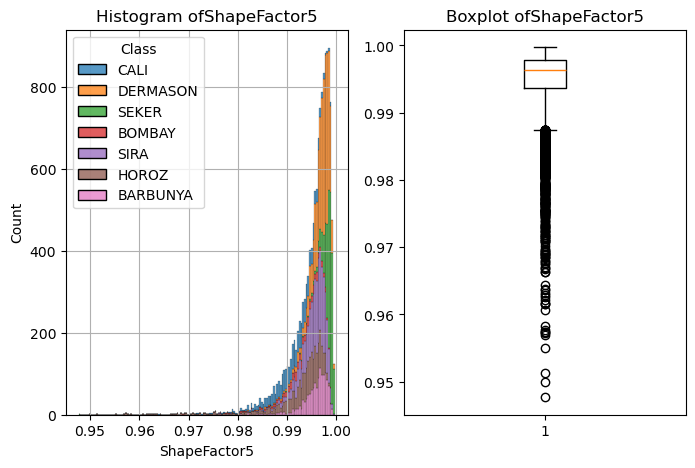

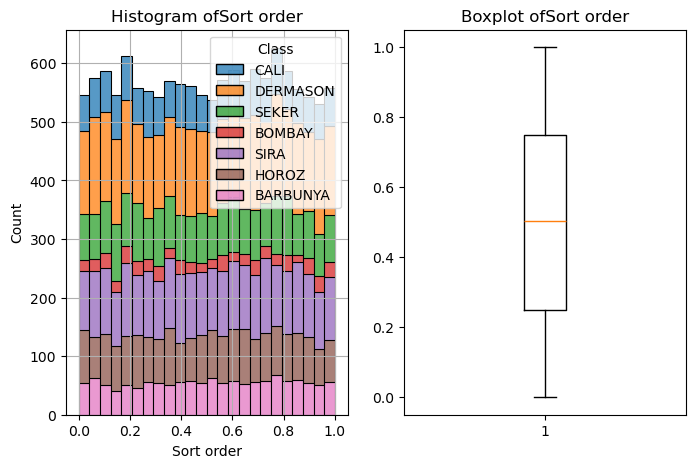

c:\Users\adkot\anaconda3\envs\env_ml4\Lib\site-packages\matplotlib\cbook.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
c:\Users\adkot\anaconda3\envs\env_ml4\Lib\site-packages\matplotlib\cbook.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
c:\Users\adkot\anaconda3\envs\env_ml4\Lib\site-packages\matplotlib\cbook.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
c:\Users\adkot\anaconda3\envs\env_ml4\Lib\site-packages\matplotlib\cbook.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


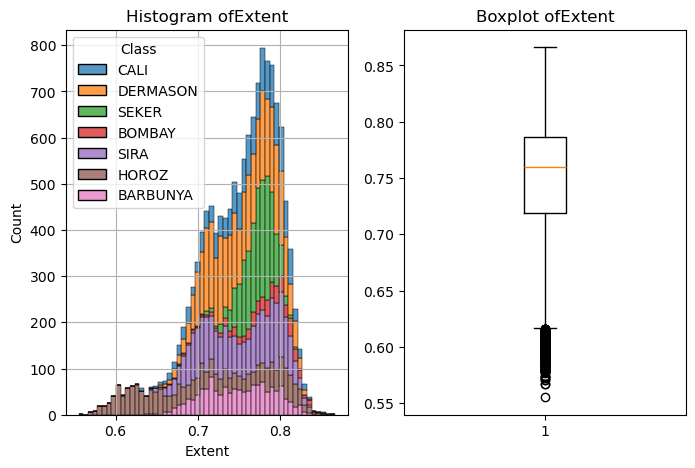

c:\Users\adkot\anaconda3\envs\env_ml4\Lib\site-packages\matplotlib\cbook.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
c:\Users\adkot\anaconda3\envs\env_ml4\Lib\site-packages\matplotlib\cbook.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
c:\Users\adkot\anaconda3\envs\env_ml4\Lib\site-packages\matplotlib\cbook.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
c:\Users\adkot\anaconda3\envs\env_ml4\Lib\site-packages\matplotlib\cbook.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


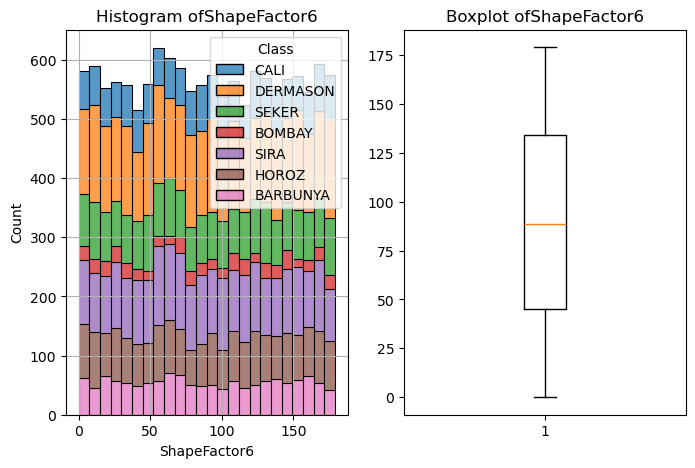

In [50]:
for numerical_feature in list(df_numerical.columns):
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(8, 5))
    data = df[numerical_feature][df[numerical_feature]!='?']

    ax = ax.flatten()
    ax[0].set_title('Histogram of' + numerical_feature)
    sns.histplot(data=df, x=numerical_feature, hue='Class', multiple='stack', kde=False, ax=ax[0])
    ax[0].grid(zorder=1)
    
    ax[1].set_title('Boxplot of' + numerical_feature)
    ax[1].boxplot(data)
    plt.show()

Impute the missing values with the median for numerical features and the mode for the categorical features.

In [45]:
df_numerical_imputed = df_numerical.apply(lambda x: x.fillna(x.median()))

In [46]:
df_numerical_imputed.isna().sum()

Area            0
AspectRation    0
Solidity        0
roundness       0
ShapeFactor1    0
ShapeFactor4    0
ShapeFactor5    0
Sort order      0
Extent          0
ShapeFactor6    0
dtype: int64

In [47]:
df_categorical_imputed = df_categorical.iloc[:, :-1].copy()
df_categorical_imputed = df_categorical_imputed.apply(lambda x: x.fillna(x.mode()[0]))
df_categorical_imputed['Class'] = df_categorical['Class'].copy()

C:\Users\adkot\AppData\Local\Temp\ipykernel_15884\664779558.py:2: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_categorical_imputed = df_categorical_imputed.apply(lambda x: x.fillna(x.mode()[0]))


In [48]:
df_categorical_imputed.isna().sum()

Colour           0
Constantness     0
Class           17
dtype: int64

### Empute misssing repsonse values with clustering
Since the categorical variable are not ordinal we will use one hot encoding to encode them numerically.

In [49]:
scaler = StandardScaler()
df_dummies = pd.get_dummies(df_categorical_imputed)
X = scaler.fit_transform(np.hstack([df_numerical_imputed.values, np.float_(df_dummies.values)]))
pca = PCA(n_components=10)
X_s = pca.fit_transform(X)

In [50]:
classes = list(df.Class.value_counts().index)

In [51]:
class_values = [classes.index(x) if type(x)==str else -1 for x in df['Class'].values]
colors = ['brown', 'green', 'blue', 'yellow', 'orange', 'pink', 'purple']

[]

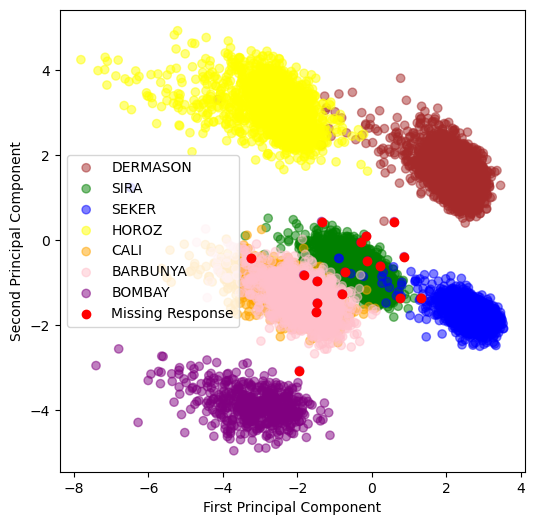

In [63]:
plt.figure(figsize=(6, 6))
for class_ in classes:
    mask = np.array([True if classes[x] == class_ else False for x in class_values])
    plt.scatter(X_s[mask, 0], X_s[mask, 1], c=[colors[classes.index(class_)]]*sum(mask), label=class_, alpha=0.5)
plt.scatter(X_s[df['Class'].isna().values.flatten(), 0], X_s[df['Class'].isna().values, 1], c='red', label='Missing Response')
plt.legend()
plt.xlabel('First Principal Component')
plt.ylabel('Second Principal Component')
plt.plot()

In [53]:
gmm = GaussianMixture(n_components=7, random_state=42)
gmm.fit(X_s[:, :10])
y_pred = gmm.predict(X_s[:,:10])

[]

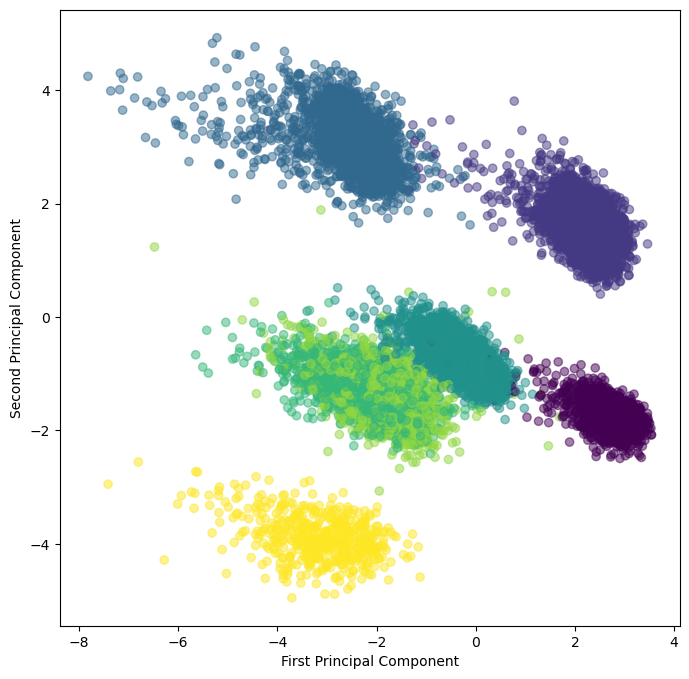

In [61]:
plt.figure(figsize=(8, 8))
plt.scatter(X_s[:, 0], X_s[:, 1], c=y_pred, alpha=0.5)
plt.xlabel('First Principal Component')
plt.ylabel('Second Principal Component')
plt.plot()

In [56]:
contingency_table = pd.crosstab(class_values, y_pred)
contingency_table

col_0,0,1,2,3,4,5,6
row_0,,,,,,,
-1,0,0,0,0,0,17,0
0,0,3541,0,0,0,1,0
1,0,0,0,2634,0,0,0
2,2022,0,0,0,0,3,0
3,0,0,1926,0,0,1,0
4,0,0,0,0,1628,0,0
5,0,0,0,0,0,1317,0
6,0,0,0,0,0,0,521


In [57]:
chi2, p, dof, expected = chi2_contingency(contingency_table)

print(f'Chi-Square Statistic: {chi2}')
print(f'p-value: {p}')

Chi-Square Statistic: 81584.1575806978
p-value: 0.0


Which seems satisfying. Hence we have extracted the extra feature.

In [84]:
df['Cluster'] = y_pred
df_categorical['Cluster'] = y_pred
df_categorical_imputed['Cluster'] = y_pred

In [85]:
df.groupby('Cluster')['Class'].apply(lambda x: x.mode()[0])#['Class'].transform(lambda x: x.fillna(x.mode()[0]))

Cluster
0       SEKER
1    DERMASON
2       HOROZ
3        SIRA
4        CALI
5    BARBUNYA
6      BOMBAY
Name: Class, dtype: object

In [90]:
sum(df_categorical_imputed.groupby('Cluster')['Class'].transform(lambda x: x.fillna(x.mode()[0])) != df_categorical_imputed['Class'])

17

In [91]:
df_categorical_imputed['Class'] = df_categorical_imputed.groupby('Cluster')['Class'].transform(lambda x: x.fillna(x.mode()[0]))

df.drop('Cluster', axis=1, inplace=True)
df_categorical.drop('Cluster', axis=1, inplace=True)
df_categorical_imputed.drop('Cluster', axis=1, inplace=True)

In [92]:
df_categorical_imputed.isna().sum()

Colour          0
Constantness    0
Class           0
dtype: int64

In [93]:
df_imputed = pd.concat([df_numerical_imputed.copy(), df_categorical_imputed.copy()], axis=1)

In [94]:
df_imputed.isna().sum()

Area            0
AspectRation    0
Solidity        0
roundness       0
ShapeFactor1    0
ShapeFactor4    0
ShapeFactor5    0
Sort order      0
Extent          0
ShapeFactor6    0
Colour          0
Constantness    0
Class           0
dtype: int64

In [95]:
columns = list(df_imputed.columns)
columns.remove('Class')
columns.append('Class')
df_imputed = df_imputed[columns]
df_imputed.head()

,Area,AspectRation,Solidity,roundness,ShapeFactor1,ShapeFactor4,ShapeFactor5,Sort order,Extent,ShapeFactor6,Colour,Constantness,Class
0,84648,1.767000,0.975443,0.830027,0.005197,3.487008,0.984066,0.134791,0.767184,50.809833,brown,1,CALI
1,39704,1.456767,0.989977,0.918880,0.006842,1.242335,0.997891,0.898848,0.757739,148.508874,black,1,DERMASON
2,35835,1.236904,0.990191,0.951588,0.006633,2.813489,0.998803,0.539684,0.790885,82.107117,green,1,SEKER
3,223035,1.621004,0.987365,0.848673,0.003052,3.074472,0.993144,0.149130,0.761092,147.347735,brown,1,BOMBAY
4,41957,1.546802,0.991657,0.895904,0.006863,2.213954,0.996497,0.447635,0.721543,22.893826,brown,1,SIRA


In [96]:
df_imputed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13611 entries, 0 to 13610
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Area          13611 non-null  int32  
 1   AspectRation  13611 non-null  float64
 2   Solidity      13611 non-null  float64
 3   roundness     13611 non-null  float64
 4   ShapeFactor1  13611 non-null  float64
 5   ShapeFactor4  13611 non-null  float64
 6   ShapeFactor5  13611 non-null  float64
 7   Sort order    13611 non-null  float64
 8   Extent        13611 non-null  float64
 9   ShapeFactor6  13611 non-null  float64
 10  Colour        13611 non-null  object 
 11  Constantness  13611 non-null  int64  
 12  Class         13611 non-null  object 
dtypes: float64(9), int32(1), int64(1), object(2)
memory usage: 1.3+ MB


In [97]:
df_imputed_dummies = pd.get_dummies(df_imputed.iloc[:, :-1])
df_imputed_dummies['Class'] = df_imputed['Class'].copy()

In [98]:
df_imputed_dummies.head()

,Area,AspectRation,Solidity,roundness,ShapeFactor1,ShapeFactor4,ShapeFactor5,Sort order,Extent,ShapeFactor6,Constantness,Colour_black,Colour_brown,Colour_green,Colour_white,Class
0,84648,1.767000,0.975443,0.830027,0.005197,3.487008,0.984066,0.134791,0.767184,50.809833,1,False,True,False,False,CALI
1,39704,1.456767,0.989977,0.918880,0.006842,1.242335,0.997891,0.898848,0.757739,148.508874,1,True,False,False,False,DERMASON
2,35835,1.236904,0.990191,0.951588,0.006633,2.813489,0.998803,0.539684,0.790885,82.107117,1,False,False,True,False,SEKER
3,223035,1.621004,0.987365,0.848673,0.003052,3.074472,0.993144,0.149130,0.761092,147.347735,1,False,True,False,False,BOMBAY
4,41957,1.546802,0.991657,0.895904,0.006863,2.213954,0.996497,0.447635,0.721543,22.893826,1,False,True,False,False,SIRA


In [99]:
df_imputed_dummies.shape

(13611, 16)

In [100]:
df_imputed_dummies.to_csv('df_modelling.csv')

In [101]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import f1_score
from imblearn.over_sampling import SMOTE

In [102]:
X = np.float_(df_imputed_dummies.drop('Class', axis=1).values)
y = np.array([classes.index(x) for x in df_imputed_dummies['Class']])

In [159]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=123)
smote = SMOTE(random_state=42)
X_train, y_train = smote.fit_resample(X_train, y_train)

In [196]:
clf = DecisionTreeClassifier(random_state=42, criterion='entropy', ccp_alpha=0.0015)
clf.fit(X_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.0015, criterion='entropy', random_state=42)

In [197]:
1+1

2

In [198]:
y_pred = clf.predict(X_test)
macro_f1 = f1_score(y_test, y_pred, average='macro')
print(f'Macro F1 score {macro_f1}')

Macro F1 score 0.9772958986570032


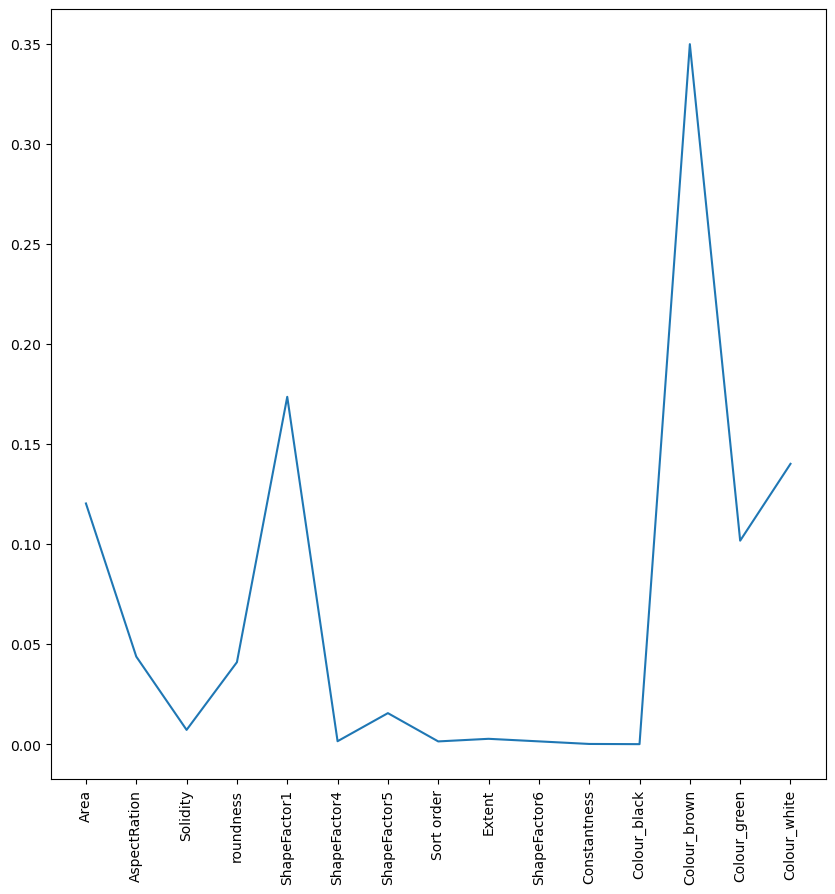

In [109]:
plt.figure(figsize=(10, 10))
plt.plot(clf.feature_importances_)
plt.xticks(list(range(15)), df_imputed_dummies.columns[:-1], rotation=90)
plt.show()

In [151]:
useful_feature_indexes = np.where(clf.feature_importances_ > 0.01)[0]
useful_feature_indexes

array([ 0,  1,  3,  4,  6, 12, 13, 14], dtype=int64)

In [152]:
from sklearn.neighbors import KNeighborsClassifier

In [153]:
X_train_s = scaler.fit_transform(X_train)
X_test_s = scaler.transform(X_test)
pca_ = PCA(n_components=8)
X_train_pca = X_train_s[:, useful_feature_indexes]#pca_.fit_transform(X_train_s)#
X_test_pca = X_test_s[:, useful_feature_indexes]#pca_.transform(X_test_s)#

In [154]:
def guassian_kernel(distances, sigma=1):
    return np.exp(distances**2 / (2*sigma**2))
knn = KNeighborsClassifier(n_neighbors=20, weights=lambda x: guassian_kernel(x))
knn.fit(X_train_pca, y_train)

KNeighborsClassifier(n_neighbors=20,
                     weights=<function <lambda> at 0x000001ACDE3553A0>)

In [155]:
y_pred = knn.predict(X_test_pca)
macro_f1 = f1_score(y_test, y_pred, average='macro')
print(f'Macro F1 score {macro_f1}')

Macro F1 score 0.9783924881492192


In [156]:
sum(y_pred!=y_test)

71

In [157]:

len(y_test)

4084

In [316]:
?KNeighborsClassifier

Init signature:
KNeighborsClassifier(
    n_neighbors=5,
    *,
    weights='uniform',
    algorithm='auto',
    leaf_size=30,
    p=2,
    metric='minkowski',
    metric_params=None,
    n_jobs=None,
)
Docstring:     
Classifier implementing the k-nearest neighbors vote.

Read more in the :ref:`User Guide <classification>`.

Parameters
----------
n_neighbors : int, default=5
    Number of neighbors to use by default for :meth:`kneighbors` queries.

weights : {'uniform', 'distance'}, callable or None, default='uniform'
    Weight function used in prediction.  Possible values:

    - 'uniform' : uniform weights.  All points in each neighborhood
      are weighted equally.
    - 'distance' : weight points by the inverse of their distance.
      in this case, closer neighbors of a query point will have a
      greater influence than neighbors which are further away.
    - [callable] : a user-defined function which accepts an
      array of distances, and returns an array of the same shape